# Instalación de librerías


In [ ]:
# Instalar las librerías necesarias
!pip install pandas geopandas folium geopy openpyxl

# Importar las librerías
import pandas as pd
import geopandas as gpd
import folium
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import time
import numpy as np
import matplotlib.pyplot as plt

print("✅ Todas las herramientas están listas!")

✅ Todas las herramientas están listas!


# Asignar la base

In [ ]:
df = pd.read_excel('/content/practica_1.xlsx')

# Información básica del archivo
print("INFORMACIÓN GENERAL DEL ARCHIVO")
print(f"Número total de filas: {len(df)}")
print(f"Número total de columnas: {len(df.columns)}")
print("\n" + "="*50)

# Ver las primeras filas
print("PRIMERAS 5 FILAS:")
print(df.head())

INFORMACIÓN GENERAL DEL ARCHIVO
Número total de filas: 5430
Número total de columnas: 46

PRIMERAS 5 FILAS:
   id  SEMANA_EPIDEMIOLOGICA FECHA_DE_NOTIFICACION EVENTO_PRESENTADO  \
0   1                      3            2014-01-15         BROTE ETA   
1   2                      4            2014-01-21         BROTE ETA   
2   3                      4            2014-01-24         BROTE ETA   
3   5                      3            2014-01-12    BROTE VARICELA   
4  13                      2            2014-01-03         BROTE ETA   

  FECHA_PRIMER_INFORME FECHA_SEGUNDO_INFORME FECHA_TERCER_INFORME  \
0          No registra           No registra          No registra   
1          No registra           No registra          No registra   
2          No registra           No registra          No registra   
3          No registra           No registra          No registra   
4          No registra           No registra          No registra   

  FECHA_DE_RESPUESTA NUMERO_TOTAL_DE_CASOS _


ANÁLISIS DE EVENTOS EPIDEMIOLÓGICOS
 TIPOS DE EVENTOS ENCONTRADOS: 56

 TOP 10 EVENTOS MÁS FRECUENTES:
 1. BROTE VARICELA: 1,445 casos (26.6%)
 2. COVID-19: 1,359 casos (25.0%)
 3. BROTE ERA: 364 casos (6.7%)
 4. ERA | ENF. RESPIRATORIA AGUDA: 287 casos (5.3%)
 5. VARICELA: 279 casos (5.1%)
 6. SARAMPIÓN - RUBÉOLA: 210 casos (3.9%)
 7. OTROS NO ESPECIFICADOS: 205 casos (3.8%)
 8. BROTE ETA: 177 casos (3.3%)
 9. BROTE EDA: 168 casos (3.1%)
10. INTOXICACIÓN: 107 casos (2.0%)

DISTRIBUCIÓN POR LOCALIDADES
 TOTAL DE LOCALIDADES: 22

 TOP 10 LOCALIDADES CON MÁS EVENTOS:
 1. KENNEDY: 720 eventos (13.3%)
 2. SUBA: 462 eventos (8.5%)
 3. ENGATIVA: 440 eventos (8.1%)
 4. USAQUEN: 395 eventos (7.3%)
 5. BOSA: 367 eventos (6.8%)
 6. PUENTE ARANDA: 322 eventos (5.9%)
 7. FONTIBON: 310 eventos (5.7%)
 8. RAFAEL URIBE: 307 eventos (5.7%)
 9. CIUDAD BAOLIVAR: 266 eventos (4.9%)
10. USME: 262 eventos (4.8%)

CREANDO VISUALIZACIONES


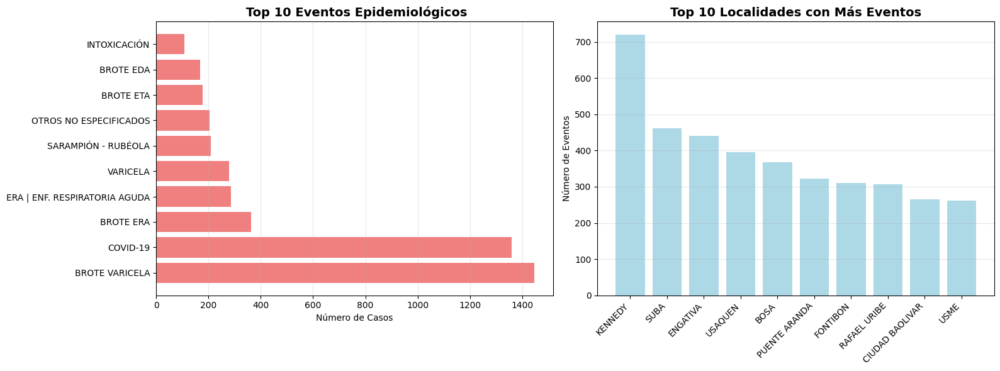

In [ ]:
# ANÁLISIS DE EVENTOS EPIDEMIOLÓGICOS
# =============================================================================

print("\n" + "="*60)
print("ANÁLISIS DE EVENTOS EPIDEMIOLÓGICOS")
print("="*60)

# Contar tipos de eventos
eventos_conteo = df['EVENTO_PRESENTADO'].value_counts()

print(f" TIPOS DE EVENTOS ENCONTRADOS: {len(eventos_conteo)}")
print(f"\n TOP 10 EVENTOS MÁS FRECUENTES:")

for i, (evento, cantidad) in enumerate(eventos_conteo.head(10).items(), 1):
    porcentaje = (cantidad / len(df)) * 100
    print(f"{i:2d}. {evento}: {cantidad:,} casos ({porcentaje:.1f}%)")

# =============================================================================
# PASO 5: DISTRIBUCIÓN GEOGRÁFICA
# =============================================================================

print("\n" + "="*60)
print("DISTRIBUCIÓN POR LOCALIDADES")
print("="*60)

# Contar eventos por localidad
localidades_conteo = df['LOCALIDAD'].value_counts()

print(f" TOTAL DE LOCALIDADES: {len(localidades_conteo)}")
print(f"\n TOP 10 LOCALIDADES CON MÁS EVENTOS:")

for i, (localidad, cantidad) in enumerate(localidades_conteo.head(10).items(), 1):
    porcentaje = (cantidad / len(df)) * 100
    print(f"{i:2d}. {localidad}: {cantidad:,} eventos ({porcentaje:.1f}%)")

# =============================================================================
# PASO 6: GRÁFICO RÁPIDO - DISTRIBUCIÓN DE EVENTOS
# =============================================================================

print("\n" + "="*60)
print("CREANDO VISUALIZACIONES")
print("="*60)

# Gráfico 1: Top 10 Eventos
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Top 10 eventos
top_eventos = eventos_conteo.head(10)
ax1.barh(range(len(top_eventos)), top_eventos.values, color='lightcoral')
ax1.set_yticks(range(len(top_eventos)))
ax1.set_yticklabels([evento[:30] + '...' if len(evento) > 30 else evento
                     for evento in top_eventos.index])
ax1.set_xlabel('Número de Casos')
ax1.set_title(' Top 10 Eventos Epidemiológicos', fontsize=14, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)

# Top 10 localidades
top_localidades = localidades_conteo.head(10)
ax2.bar(range(len(top_localidades)), top_localidades.values, color='lightblue')
ax2.set_xticks(range(len(top_localidades)))
ax2.set_xticklabels(top_localidades.index, rotation=45, ha='right')
ax2.set_ylabel('Número de Eventos')
ax2.set_title('Top 10 Localidades con Más Eventos', fontsize=14, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# Examinar la columna de direcciones
print("ANÁLISIS DE DIRECCIONES")
print("="*50)

# Contar direcciones válidas
direcciones_validas = df['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO'].notna()
print(f"Direcciones disponibles: {direcciones_validas.sum()}")
print(f"Direcciones faltantes: {len(df) - direcciones_validas.sum()}")

# Mostrar ejemplos de direcciones
print("\nEJEMPLOS DE DIRECCIONES:")
ejemplos = df['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO'].dropna().head(10)
for i, direccion in enumerate(ejemplos, 1):
    print(f"{i:2d}. {direccion}")

# Verificar localidades disponibles
print("\n LOCALIDADES EN LOS DATOS:")
localidades = df['LOCALIDAD'].value_counts().head(10)
for localidad, cantidad in localidades.items():
    print(f"• {localidad}: {cantidad} casos")

ANÁLISIS DE DIRECCIONES
Direcciones disponibles: 5430
Direcciones faltantes: 0

EJEMPLOS DE DIRECCIONES:
 1. AV CL 13 68 F 25
 2. KR 43 A 20 C 55
 3. KR 68D 39 F 51 SUR
 4. KR 15 32 72
 5. KR 8  1C  50 SUR
 6. CL 10 A LA 11  ENTRE KR 7 Y 8
 7. CL 10 A LA 11  ENTRE KR 7 Y 8
 8. Cl 22A BisA 92 03
 9. CR 16 # 102 - 04
10. CLL 106A  N° 8 A -19

 LOCALIDADES EN LOS DATOS:
• KENNEDY: 720 casos
• SUBA: 462 casos
• ENGATIVA: 440 casos
• USAQUEN: 395 casos
• BOSA: 367 casos
• PUENTE ARANDA: 322 casos
• FONTIBON: 310 casos
• RAFAEL URIBE: 307 casos
• CIUDAD BAOLIVAR: 266 casos
• USME: 262 casos


In [ ]:
# Seleccionar solo las variables esenciales para geocodificación
variables_esenciales = [
    'id',
    'EVENTO_PRESENTADO',
    'FECHA_DE_NOTIFICACION',
    'LOCALIDAD',
    'UPZ',
    'BARRIO',
    'DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO',
    'COORDENADAS_DEL_LUGAR_DEL_EVENTO',
    'TIPO_DE_ESTABLECIMIENTO'
]

# Verificar que todas las variables existan
variables_disponibles = [var for var in variables_esenciales if var in df.columns]
print(f"\n📋 Variables seleccionadas para trabajar: {len(variables_disponibles)}")

# Crear dataset limpio
df_geo = df[variables_disponibles].copy()

print(f"✅ Dataset optimizado creado con {len(df_geo.columns)} variables")


📋 Variables seleccionadas para trabajar: 9
✅ Dataset optimizado creado con 9 variables


In [ ]:
df_geo.head()

,id,EVENTO_PRESENTADO,FECHA_DE_NOTIFICACION,LOCALIDAD,UPZ,BARRIO,DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO,COORDENADAS_DEL_LUGAR_DEL_EVENTO,TIPO_DE_ESTABLECIMIENTO
0,1,BROTE ETA,2014-01-15,KENNEDY,BAVARIA,EL RECODO PETALUNA,AV CL 13 68 F 25,",",OTROS
1,2,BROTE ETA,2014-01-21,PUENTE ARANDA,PUENTE ARANDA,ORTEZAL,KR 43 A 20 C 55,",",OTROS
2,3,BROTE ETA,2014-01-24,KENNEDY,CARVAJAL,ALQUERIA LA FRAGUA,KR 68D 39 F 51 SUR,",",OTROS
3,5,BROTE VARICELA,2014-01-12,TEUSAQUILLO,TEUSAQUILLO,TEUSAQUILLO,KR 15 32 72,"74°04´14,51´´,4°37´16,25´´",OTROS
4,13,BROTE ETA,2014-01-03,SAN CRISTOBAL,SOCIEGO,SOSIEGO,KR 8 1C 50 SUR,",",CENTRO DE RECLUSION


In [ ]:
# =============================================================================
# PASO 4: FUNCIÓN DE LIMPIEZA DE DIRECCIONES
# =============================================================================

print("\n PASO 4: Creando función para limpiar direcciones...")

# Importar módulo necesario para expresiones regulares
import re
import pandas as pd

def limpiar_direccion_bogota(direccion):
    """
    Función para limpiar y estandarizar direcciones de Bogotá

    Parámetros:
    direccion (str): La dirección original

    Retorna:
    str: La dirección limpia y estandarizada
    """

    # Si la dirección está vacía o es nula, retornar None
    if pd.isna(direccion) or direccion == '' or direccion == 'No registra':
        return None

    # Convertir a string y limpiar espacios
    direccion = str(direccion).strip().upper()

    # Reemplazar abreviaciones comunes de Bogotá
    direccion = re.sub(r'\bKR\b', 'CARRERA', direccion)
    direccion = re.sub(r'\bCR\b', 'CARRERA', direccion)
    direccion = re.sub(r'\bCL\b', 'CALLE', direccion)
    direccion = re.sub(r'\bCLL\b', 'CALLE', direccion)
    direccion = re.sub(r'\bAV\b', 'AVENIDA', direccion)
    direccion = re.sub(r'\bAVD\b', 'AVENIDA', direccion)
    direccion = re.sub(r'\bTV\b', 'TRANSVERSAL', direccion)
    direccion = re.sub(r'\bDG\b', 'DIAGONAL', direccion)

    # Limpiar símbolos comunes
    direccion = direccion.replace('#', ' NUMERO ')
    direccion = direccion.replace('N°', ' NUMERO ')
    direccion = direccion.replace('°', '')
    direccion = direccion.replace('´', '')
    direccion = direccion.replace('`', '')

    # Limpiar espacios múltiples
    direccion = re.sub(r'\s+', ' ', direccion).strip()

    # Agregar contexto geográfico para mejor geocodificación
    if 'BOGOTA' not in direccion and 'COLOMBIA' not in direccion:
        direccion = f"{direccion}, BOGOTA, COLOMBIA"

    return direccion

print(" Función de limpieza creada!")

# Ejemplo de cómo funciona la limpieza
print("\n EJEMPLO DE LIMPIEZA:")
direccion_test = "KR 43 A 20 C 55"
direccion_limpia = limpiar_direccion_bogota(direccion_test)
print(f"   Original: {direccion_test}")
print(f"   Limpia:   {direccion_limpia}")

# Más ejemplos para verificar que funciona
print("\n MÁS EJEMPLOS DE LIMPIEZA:")
ejemplos_test = [
    "CL 106A N° 8 A -19",
    "AV CL 13 68 F 25",
    "CR 16 # 102 - 04",
    "KR 68D 39 F 51 SUR",
    "TV 45 BIS A 22 - 15"
]

for i, direccion in enumerate(ejemplos_test, 1):
    limpia = limpiar_direccion_bogota(direccion)
    print(f"   {i}. Original: {direccion}")
    print(f"      Limpia:   {limpia}")
    print("      " + "-" * 50)


 PASO 4: Creando función para limpiar direcciones...
 Función de limpieza creada!

 EJEMPLO DE LIMPIEZA:
   Original: KR 43 A 20 C 55
   Limpia:   CARRERA 43 A 20 C 55, BOGOTA, COLOMBIA

 MÁS EJEMPLOS DE LIMPIEZA:
   1. Original: CL 106A N° 8 A -19
      Limpia:   CALLE 106A NUMERO 8 A -19, BOGOTA, COLOMBIA
      --------------------------------------------------
   2. Original: AV CL 13 68 F 25
      Limpia:   AVENIDA CALLE 13 68 F 25, BOGOTA, COLOMBIA
      --------------------------------------------------
   3. Original: CR 16 # 102 - 04
      Limpia:   CARRERA 16 NUMERO 102 - 04, BOGOTA, COLOMBIA
      --------------------------------------------------
   4. Original: KR 68D 39 F 51 SUR
      Limpia:   CARRERA 68D 39 F 51 SUR, BOGOTA, COLOMBIA
      --------------------------------------------------
   5. Original: TV 45 BIS A 22 - 15
      Limpia:   TRANSVERSAL 45 BIS A 22 - 15, BOGOTA, COLOMBIA
      --------------------------------------------------


In [ ]:
for i, direccion in enumerate(ejemplos_test, 1):
    limpia = limpiar_direccion_bogota(direccion)
    print(f"   {i}. Original: {direccion}")
    print(f"      Limpia:   {limpia}")
    print("      " + "-" * 50)

   1. Original: CL 106A N° 8 A -19
      Limpia:   CALLE 106A NUMERO 8 A -19, BOGOTA, COLOMBIA
      --------------------------------------------------
   2. Original: AV CL 13 68 F 25
      Limpia:   AVENIDA CALLE 13 68 F 25, BOGOTA, COLOMBIA
      --------------------------------------------------
   3. Original: CR 16 # 102 - 04
      Limpia:   CARRERA 16 NUMERO 102 - 04, BOGOTA, COLOMBIA
      --------------------------------------------------
   4. Original: KR 68D 39 F 51 SUR
      Limpia:   CARRERA 68D 39 F 51 SUR, BOGOTA, COLOMBIA
      --------------------------------------------------
   5. Original: TV 45 BIS A 22 - 15
      Limpia:   TRANSVERSAL 45 BIS A 22 - 15, BOGOTA, COLOMBIA
      --------------------------------------------------


In [ ]:
# =============================================================================
# PASO 5: APLICAR LIMPIEZA A TODAS LAS DIRECCIONES
# =============================================================================

print("\n PASO 5: Limpiando todas las direcciones...")

# Aplicar la función de limpieza
df_geo['direccion_limpia'] = df_geo['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO'].apply(limpiar_direccion_bogota)

# Contar direcciones limpiadas exitosamente
direcciones_limpiadas = df_geo['direccion_limpia'].notna().sum()

print(f" Proceso de limpieza completado!")
print(f"   • Direcciones procesadas: {direcciones_limpiadas:,}")
print(f"   • Tasa de éxito: {(direcciones_limpiadas/len(df_geo['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO']))*100:.1f}%")

# Mostrar comparación antes y después
print(f"\n COMPARACIÓN ANTES Y DESPUÉS (5 ejemplos):")
muestra = df_geo[['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO', 'direccion_limpia']].dropna().head(5)

for i, (original, limpia) in enumerate(zip(muestra['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO'],
                                          muestra['direccion_limpia']), 1):
    print(f"   {i}. Original: {original}")
    print(f"      Limpia:   {limpia}")
    print("      " + "-" * 50)


 PASO 5: Limpiando todas las direcciones...
 Proceso de limpieza completado!
   • Direcciones procesadas: 5,427
   • Tasa de éxito: 99.9%

 COMPARACIÓN ANTES Y DESPUÉS (5 ejemplos):
   1. Original: AV CL 13 68 F 25
      Limpia:   AVENIDA CALLE 13 68 F 25, BOGOTA, COLOMBIA
      --------------------------------------------------
   2. Original: KR 43 A 20 C 55
      Limpia:   CARRERA 43 A 20 C 55, BOGOTA, COLOMBIA
      --------------------------------------------------
   3. Original: KR 68D 39 F 51 SUR
      Limpia:   CARRERA 68D 39 F 51 SUR, BOGOTA, COLOMBIA
      --------------------------------------------------
   4. Original: KR 15 32 72
      Limpia:   CARRERA 15 32 72, BOGOTA, COLOMBIA
      --------------------------------------------------
   5. Original: KR 8  1C  50 SUR
      Limpia:   CARRERA 8 1C 50 SUR, BOGOTA, COLOMBIA
      --------------------------------------------------


In [ ]:
#=============================================================================
# PASO 6: CONFIGURAR GEOCODIFICADOR
# =============================================================================

print("\n PASO 6: Configurando el servicio de geocodificación...")

# Configurar Nominatim (servicio gratuito de OpenStreetMap)
geolocator = Nominatim(
    user_agent="tutorial_geocodificacion_estudiantes_bogota_2024",
    timeout=10
)

# Crear limitador de velocidad para evitar sobrecargar el servicio
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1.5)

print(" Geocodificador configurado!")
print("   • Servicio: Nominatim (OpenStreetMap)")
print("   • Límite: 1 solicitud cada 1.5 segundos")
print("   • Timeout: 10 segundos por dirección")


 PASO 6: Configurando el servicio de geocodificación...
 Geocodificador configurado!
   • Servicio: Nominatim (OpenStreetMap)
   • Límite: 1 solicitud cada 1.5 segundos
   • Timeout: 10 segundos por dirección


In [ ]:
# =============================================================================
# PASO 7: FUNCIÓN DE GEOCODIFICACIÓN BÁSICA
# =============================================================================

def geocodificar_direccion(direccion, intentos=2):
    """
    Función para geocodificar una dirección individual

    Parámetros:
    direccion (str): La dirección a geocodificar
    intentos (int): Número de intentos en caso de fallo

    Retorna:
    tuple: (latitud, longitud, direccion_encontrada) o (None, None, None)
    """

    if pd.isna(direccion) or direccion == '':
        return None, None, None

    for intento in range(intentos):
        try:
            # Intentar geocodificar
            location = geocode(direccion)

            if location:
                return location.latitude, location.longitude, location.address
            else:
                # Si no encuentra, intentar con versión simplificada
                if intento == 0:  # Solo en el primer intento
                    direccion_simple = direccion.split(',')[0]  # Tomar solo la primera parte
                    location = geocode(f"{direccion_simple}, BOGOTA, COLOMBIA")
                    if location:
                        return location.latitude, location.longitude, location.address

        except Exception as e:
            print(f" Error con dirección: {direccion[:50]}... - {str(e)}")
            if intento < intentos - 1:
                time.sleep(2)  # Esperar antes del siguiente intento
            continue

    return None, None, None

print("Función de geocodificación básica creada!")

# =============================================================================


Función de geocodificación básica creada!


In [ ]:
# =============================================================================
# PASO 8: PROCESO DE GEOCODIFICACIÓN INICIAL
# =============================================================================

print("\n🎯 PASO 8: Iniciando proceso de geocodificación básica...")

# Preparar columnas para resultados
df_geo['latitud'] = np.nan
df_geo['longitud'] = np.nan
df_geo['direccion_encontrada'] = ''
df_geo['geocodificacion_exitosa'] = False

# IMPORTANTE: procesaremos solo una muestra
# pero se debe procesar todo
MUESTRA_SIZE = 100  # Cambiar a len(df_geo) para procesar todo

print(f" CONFIGURACIÓN DEL PROCESO BÁSICO:")
print(f"   • Direcciones a procesar: {MUESTRA_SIZE}")
print(f"   • Tiempo estimado: {MUESTRA_SIZE * 1.5 / 60:.1f} minutos")
print(f"   • Método: Nominatim con límite de velocidad")

# Confirmar inicio
print(f"\n INICIANDO GEOCODIFICACIÓN BÁSICA...")
print(f" Hora de inicio: {time.strftime('%H:%M:%S')}")

# Filtrar direcciones válidas para procesar
direcciones_para_procesar = df_geo['direccion_limpia'].dropna().head(MUESTRA_SIZE)
total_a_procesar = len(direcciones_para_procesar)

# Contadores para seguimiento
exitosas = 0
fallidas = 0
tiempo_inicio = time.time()

# Procesar cada dirección
for i, (index, direccion) in enumerate(direcciones_para_procesar.items()):

    # Mostrar progreso cada 10 direcciones
    if (i + 1) % 10 == 0:
        progreso = ((i + 1) / total_a_procesar) * 100
        tiempo_transcurrido = time.time() - tiempo_inicio
        tiempo_estimado_total = (tiempo_transcurrido / (i + 1)) * total_a_procesar
        tiempo_restante = tiempo_estimado_total - tiempo_transcurrido

        print(f" Progreso: {progreso:.1f}% ({i + 1}/{total_a_procesar}) | "
              f" Tiempo restante: {tiempo_restante/60:.1f} min | "
              f" Exitosas: {exitosas}")

    # Geocodificar la dirección
    lat, lon, direccion_encontrada = geocodificar_direccion(direccion)

    # Guardar resultados
    if lat is not None and lon is not None:
        df_geo.loc[index, 'latitud'] = lat
        df_geo.loc[index, 'longitud'] = lon
        df_geo.loc[index, 'direccion_encontrada'] = direccion_encontrada or ''
        df_geo.loc[index, 'geocodificacion_exitosa'] = True
        exitosas += 1
    else:
        df_geo.loc[index, 'geocodificacion_exitosa'] = False
        fallidas += 1

# Estadísticas de la geocodificación básica
tiempo_total_basico = time.time() - tiempo_inicio

print(f"\n GEOCODIFICACIÓN BÁSICA COMPLETADA!")
print(f" Tiempo total: {tiempo_total_basico/60:.1f} minutos")
print(f" RESULTADOS BÁSICOS:")
print(f"   • Direcciones procesadas: {total_a_procesar}")
print(f"   • Geocodificación exitosa: {exitosas}")
print(f"   • Geocodificación fallida: {fallidas}")
print(f"   • Tasa de éxito: {(exitosas/total_a_procesar)*100:.1f}%")

# =============================================================================



🎯 PASO 8: Iniciando proceso de geocodificación básica...
 CONFIGURACIÓN DEL PROCESO BÁSICO:
   • Direcciones a procesar: 100
   • Tiempo estimado: 2.5 minutos
   • Método: Nominatim con límite de velocidad

 INICIANDO GEOCODIFICACIÓN BÁSICA...
 Hora de inicio: 12:08:02
 Progreso: 10.0% (10/100) |  Tiempo restante: 6.3 min |  Exitosas: 2
 Progreso: 20.0% (20/100) |  Tiempo restante: 5.2 min |  Exitosas: 5
 Progreso: 30.0% (30/100) |  Tiempo restante: 4.0 min |  Exitosas: 15
 Progreso: 40.0% (40/100) |  Tiempo restante: 3.4 min |  Exitosas: 20
 Progreso: 50.0% (50/100) |  Tiempo restante: 3.2 min |  Exitosas: 21
 Progreso: 60.0% (60/100) |  Tiempo restante: 2.5 min |  Exitosas: 25
 Progreso: 70.0% (70/100) |  Tiempo restante: 1.9 min |  Exitosas: 29
 Progreso: 80.0% (80/100) |  Tiempo restante: 1.3 min |  Exitosas: 32
 Progreso: 90.0% (90/100) |  Tiempo restante: 0.6 min |  Exitosas: 35
 Progreso: 100.0% (100/100) |  Tiempo restante: 0.0 min |  Exitosas: 38

 GEOCODIFICACIÓN BÁSICA COMP

In [ ]:
# =============================================================================
# PASO 9: VALIDACIÓN DE RESULTADOS BÁSICOS
# =============================================================================

print("\n PASO 9: Validando resultados básicos...")

# Filtrar solo datos geocodificados exitosamente
datos_geocodificados_basicos = df_geo[df_geo['geocodificacion_exitosa'] == True].copy()

if len(datos_geocodificados_basicos) > 0:

    # Estadísticas de coordenadas
    lat_min = datos_geocodificados_basicos['latitud'].min()
    lat_max = datos_geocodificados_basicos['latitud'].max()
    lon_min = datos_geocodificados_basicos['longitud'].min()
    lon_max = datos_geocodificados_basicos['longitud'].max()

    print(f" ESTADÍSTICAS DE COORDENADAS:")
    print(f"   • Latitud: {lat_min:.6f} a {lat_max:.6f}")
    print(f"   • Longitud: {lon_min:.6f} a {lon_max:.6f}")

    # Verificar si están en el rango de Bogotá
    en_bogota = ((lat_min >= 4.0) and (lat_max <= 5.0) and
                 (lon_min >= -75.0) and (lon_max <= -73.0))

    if en_bogota:
        print(" Las coordenadas están en el rango correcto para Bogotá")
    else:
        print(" Algunas coordenadas pueden estar fuera del área de Bogotá")

    print(f"\n EJEMPLOS DE GEOCODIFICACIÓN EXITOSA:")
    ejemplos = datos_geocodificados_basicos[['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO',
                                           'latitud', 'longitud', 'LOCALIDAD']].head(3)

    for i, row in ejemplos.iterrows():
        print(f"   {len([x for x in ejemplos.index if x <= i])}. Dirección: {row['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO']}")
        print(f"      Coordenadas: {row['latitud']:.6f}, {row['longitud']:.6f}")
        print(f"      Localidad: {row['LOCALIDAD']}")
        print("      " + "-" * 60)


 PASO 9: Validando resultados básicos...
 ESTADÍSTICAS DE COORDENADAS:
   • Latitud: 4.498761 a 4.749248
   • Longitud: -74.211065 a -74.046791
 Las coordenadas están en el rango correcto para Bogotá

 EJEMPLOS DE GEOCODIFICACIÓN EXITOSA:
   1. Dirección: KR 15 32 72
      Coordenadas: 4.623974, -74.070233
      Localidad: TEUSAQUILLO
      ------------------------------------------------------------
   2. Dirección: KR 8  1C  50 SUR
      Coordenadas: 4.505425, -74.109631
      Localidad: SAN CRISTOBAL
      ------------------------------------------------------------
   3. Dirección: KR 87A  6A 23
      Coordenadas: 4.649027, -74.150884
      Localidad: KENNEDY
      ------------------------------------------------------------


In [ ]:
# =============================================================================
# PASO 10: CREAR MAPA BÁSICO
# =============================================================================

print("\n PASO 10: Creando mapa básico...")

if len(datos_geocodificados_basicos) > 0:

    # Calcular centro del mapa
    centro_lat = datos_geocodificados_basicos['latitud'].mean()
    centro_lon = datos_geocodificados_basicos['longitud'].mean()

    # Crear mapa base
    mapa_basico = folium.Map(
        location=[centro_lat, centro_lon],
        zoom_start=11,
        tiles='OpenStreetMap'
    )

    # Agregar puntos al mapa
    for _, row in datos_geocodificados_basicos.iterrows():
        popup_html = f"""
        <div style="width: 250px;">
        <h4><b> Evento Epidemiológico</b></h4>
        <hr>
        <p><b> Evento:</b> {row['EVENTO_PRESENTADO']}</p>
        <p><b> Dirección:</b> {row['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO']}</p>
        <p><b> Localidad:</b> {row['LOCALIDAD']}</p>
        <p><b> Coordenadas:</b><br>{row['latitud']:.6f}, {row['longitud']:.6f}</p>
        </div>
        """

        folium.Marker(
            location=[row['latitud'], row['longitud']],
            popup=folium.Popup(popup_html, max_width=300),
            tooltip=f" {row['EVENTO_PRESENTADO']} - {row['LOCALIDAD']}",
            icon=folium.Icon(color='red', icon='info-sign')
        ).add_to(mapa_basico)

    # Guardar mapa básico
    nombre_mapa_basico = 'mapa_geocodificacion_basica.html'
    mapa_basico.save(nombre_mapa_basico)

    print(f" Mapa básico creado!")
    print(f"   • Puntos en el mapa: {len(datos_geocodificados_basicos)}")
    print(f"   • Archivo guardado: {nombre_mapa_basico}")


 PASO 10: Creando mapa básico...
 Mapa básico creado!
   • Puntos en el mapa: 38
   • Archivo guardado: mapa_geocodificacion_basica.html


In [ ]:
# =============================================================================
# PASO 11: CREAR SHAPEFILE BÁSICO
# =============================================================================

from shapely.geometry import Point

print("\n PASO 11: Creando shapefile básico...")

if len(datos_geocodificados_basicos) > 0:

    # Crear geometría de puntos
    geometria = [Point(lon, lat) for lat, lon in
                 zip(datos_geocodificados_basicos['latitud'], datos_geocodificados_basicos['longitud'])]

    # Crear GeoDataFrame
    gdf_basico = gpd.GeoDataFrame(datos_geocodificados_basicos, geometry=geometria)
    gdf_basico.crs = "EPSG:4326"

    # Guardar shapefile básico
    nombre_shapefile_basico = 'eventos_geocodificacion_basica'
    gdf_basico.to_file(f'{nombre_shapefile_basico}.shp', driver='ESRI Shapefile')

    print(f" Shapefile básico creado!")
    print(f"   • Archivo: {nombre_shapefile_basico}.shp")
    print(f"   • Puntos incluidos: {len(gdf_basico)}")



 PASO 11: Creando shapefile básico...
 Shapefile básico creado!
   • Archivo: eventos_geocodificacion_basica.shp
   • Puntos incluidos: 38


/tmp/ipython-input-4158080763.py:21: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_basico.to_file(f'{nombre_shapefile_basico}.shp', driver='ESRI Shapefile')
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'EVENTO_PRESENTADO' to 'EVENTO_PRE'
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'FECHA_DE_NOTIFICACION' to 'FECHA_DE_N'
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Field FECHA_DE_N create as date field, though DateTime requested.
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO' to 'DIRECCIÓN'
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'COORDENADAS_DEL_LUGAR_DE

In [ ]:
# =============================================================================
# PASO 12: EXPORTAR RESULTADOS BÁSICOS
# =============================================================================

print("\n💾 PASO 12: Exportando resultados básicos...")

# Crear archivo Excel básico
nombre_excel_basico = 'resultados_geocodificacion_basica.xlsx'

with pd.ExcelWriter(nombre_excel_basico, engine='openpyxl') as writer:
    df_geo.to_excel(writer, sheet_name='Datos_Basicos', index=False)
    if len(datos_geocodificados_basicos) > 0:
        datos_geocodificados_basicos.to_excel(writer, sheet_name='Solo_Geocodificados', index=False)

print(f" Resultados básicos exportados!")




💾 PASO 12: Exportando resultados básicos...
 Resultados básicos exportados!


In [ ]:
# =============================================================================
# PASO 13: RESUMEN DE GEOCODIFICACIÓN BÁSICA
# =============================================================================

print("\n PASO 13: Resumen de geocodificación básica...")

tasa_exito_basica = (exitosas / total_a_procesar) * 100 if total_a_procesar > 0 else 0

print(f"\n RESUMEN DE GEOCODIFICACIÓN BÁSICA:")
print(f"   • Direcciones procesadas: {total_a_procesar}")
print(f"   • Geocodificación exitosa: {exitosas}")
print(f"   • Tasa de éxito: {tasa_exito_basica:.1f}%")
print(f"   • Tiempo empleado: {tiempo_total_basico/60:.1f} minutos")

# =============================================================================
# PARTE 2: OPTIMIZACIÓN AVANZADA
# =============================================================================

print("\n\n" + " PARTE 2: OPTIMIZACIÓN AVANZADA".center(70))
print("=" * 70)
print("Ahora vamos a mejorar los resultados usando técnicas avanzadas")


 PASO 13: Resumen de geocodificación básica...

 RESUMEN DE GEOCODIFICACIÓN BÁSICA:
   • Direcciones procesadas: 100
   • Geocodificación exitosa: 38
   • Tasa de éxito: 38.0%
   • Tiempo empleado: 6.7 minutos


                    PARTE 2: OPTIMIZACIÓN AVANZADA                    
Ahora vamos a mejorar los resultados usando técnicas avanzadas


In [ ]:
# =============================================================================
# PASO 14: ANÁLISIS DE DIRECCIONES FALLIDAS
# =============================================================================

print("\n PASO 14: Analizando direcciones que fallaron...")

# Filtrar direcciones que fallaron
direcciones_fallidas = df_geo[df_geo['geocodificacion_exitosa'] == False]['direccion_limpia'].dropna()
direcciones_exitosas = df_geo[df_geo['geocodificacion_exitosa'] == True]['direccion_limpia'].dropna()

print(f" ANÁLISIS DE RESULTADOS BÁSICOS:")
print(f"   • Direcciones exitosas: {len(direcciones_exitosas)}")
print(f"   • Direcciones fallidas: {len(direcciones_fallidas)}")

# Mostrar ejemplos de direcciones fallidas
print(f"\n EJEMPLOS DE DIRECCIONES QUE FALLARON:")
for i, direccion in enumerate(direcciones_fallidas.head(8), 1):
    print(f"   {i}. {direccion}")

# Analizar patrones en las fallas
print(f"\n PATRONES EN DIRECCIONES FALLIDAS:")
patrones_falla = {
    'Muy largas (>80 chars)': len([d for d in direcciones_fallidas if len(str(d)) > 80]),
    'Con "BIS"': len([d for d in direcciones_fallidas if 'BIS' in str(d)]),
    'Con múltiples números': len([d for d in direcciones_fallidas if str(d).count(' ') > 8]),
    'Con "ENTRE"': len([d for d in direcciones_fallidas if 'ENTRE' in str(d)]),
    'Sin números': len([d for d in direcciones_fallidas if not any(c.isdigit() for c in str(d))])
}

for patron, cantidad in patrones_falla.items():
    if cantidad > 0:
        porcentaje = (cantidad / len(direcciones_fallidas)) * 100
        print(f"   • {patron}: {cantidad} ({porcentaje:.1f}%)")


 PASO 14: Analizando direcciones que fallaron...
 ANÁLISIS DE RESULTADOS BÁSICOS:
   • Direcciones exitosas: 38
   • Direcciones fallidas: 5389

 EJEMPLOS DE DIRECCIONES QUE FALLARON:
   1. AVENIDA CALLE 13 68 F 25, BOGOTA, COLOMBIA
   2. CARRERA 43 A 20 C 55, BOGOTA, COLOMBIA
   3. CARRERA 68D 39 F 51 SUR, BOGOTA, COLOMBIA
   4. CALLE 10 A LA 11 ENTRE CARRERA 7 Y 8, BOGOTA, COLOMBIA
   5. CALLE 10 A LA 11 ENTRE CARRERA 7 Y 8, BOGOTA, COLOMBIA
   6. CALLE 22A BISA 92 03, BOGOTA, COLOMBIA
   7. CARRERA 16 NUMERO 102 - 04, BOGOTA, COLOMBIA
   8. CALLE 106A NUMERO 8 A -19, BOGOTA, COLOMBIA

 PATRONES EN DIRECCIONES FALLIDAS:
   • Con "BIS": 407 (7.6%)
   • Con múltiples números: 177 (3.3%)
   • Con "ENTRE": 5 (0.1%)
   • Sin números: 23 (0.4%)


In [ ]:
# =============================================================================
# PASO 15: FUNCIÓN DE LIMPIEZA AVANZADA CON ESTRATEGIAS MÚLTIPLES
# =============================================================================

print("\n PASO 15: Creando función de limpieza avanzada...")

def limpiar_direccion_estrategias_multiples(direccion_original):
    """
    Función avanzada que genera múltiples versiones de una dirección
    para aumentar las posibilidades de geocodificación exitosa
    """

    if pd.isna(direccion_original) or direccion_original == '' or direccion_original == 'No registra':
        return []

    direccion = str(direccion_original).strip().upper()
    estrategias = []

    # ESTRATEGIA 1: Limpieza básica (como antes)
    d1 = direccion
    d1 = re.sub(r'\bKR\b', 'CARRERA', d1)
    d1 = re.sub(r'\bCR\b', 'CARRERA', d1)
    d1 = re.sub(r'\bCL\b', 'CALLE', d1)
    d1 = re.sub(r'\bCLL\b', 'CALLE', d1)
    d1 = re.sub(r'\bAV\b', 'AVENIDA', d1)
    d1 = d1.replace('#', ' ')
    d1 = d1.replace('N°', ' ')
    d1 = re.sub(r'\s+', ' ', d1).strip()
    estrategias.append(f"{d1}, BOGOTA, COLOMBIA")

    # ESTRATEGIA 2: Versión simplificada (solo números principales)
    d2 = re.sub(r'\b(CARRERA|CALLE|AVENIDA)\b', '', d1)
    numeros = re.findall(r'\d+', d2)
    if len(numeros) >= 2:
        d2_simple = f"CALLE {numeros[0]} CARRERA {numeros[1]}, BOGOTA, COLOMBIA"
        estrategias.append(d2_simple)

    # ESTRATEGIA 3: Sin BIS, SUR, etc. (versión limpia)
    d3 = d1
    d3 = re.sub(r'\bBIS\b', '', d3)
    d3 = re.sub(r'\bSUR\b', '', d3)
    d3 = re.sub(r'\bNORTE\b', '', d3)
    d3 = re.sub(r'\bESTE\b', '', d3)
    d3 = re.sub(r'\bOESTE\b', '', d3)
    d3 = re.sub(r'\s+', ' ', d3).strip()
    if d3 != d1:
        estrategias.append(f"{d3}, BOGOTA, COLOMBIA")

    # ESTRATEGIA 4: Solo con localidad (para casos muy problemáticos)
    estrategias.append("BOGOTA, COLOMBIA")

    # ESTRATEGIA 5: Dirección original sin cambios + Bogotá
    if 'BOGOTA' not in direccion_original.upper():
        estrategias.append(f"{direccion_original}, BOGOTA, COLOMBIA")

    return estrategias

print(" Función de limpieza avanzada creada!")

# Ejemplo de las estrategias
print("\n EJEMPLO DE ESTRATEGIAS MÚLTIPLES:")
direccion_test = "KR 68D 39 F 51 BIS SUR"
estrategias_test = limpiar_direccion_estrategias_multiples(direccion_test)
print(f"   Original: {direccion_test}")
for i, estrategia in enumerate(estrategias_test, 1):
    print(f"   Estrategia {i}: {estrategia}")


 PASO 15: Creando función de limpieza avanzada...
 Función de limpieza avanzada creada!

 EJEMPLO DE ESTRATEGIAS MÚLTIPLES:
   Original: KR 68D 39 F 51 BIS SUR
   Estrategia 1: CARRERA 68D 39 F 51 BIS SUR, BOGOTA, COLOMBIA
   Estrategia 2: CALLE 68 CARRERA 39, BOGOTA, COLOMBIA
   Estrategia 3: CARRERA 68D 39 F 51, BOGOTA, COLOMBIA
   Estrategia 4: BOGOTA, COLOMBIA
   Estrategia 5: KR 68D 39 F 51 BIS SUR, BOGOTA, COLOMBIA


In [ ]:
# =============================================================================
# PASO 16: FUNCIÓN DE GEOCODIFICACIÓN AVANZADA
# =============================================================================

print("\n PASO 16: Creando función de geocodificación avanzada...")

def geocodificar_con_estrategias_multiples(direccion_original, localidad=None):
    """
    Función que intenta geocodificar usando múltiples estrategias
    hasta encontrar una que funcione
    """

    if pd.isna(direccion_original):
        return None, None, None, "Sin dirección"

    # Obtener todas las estrategias posibles
    estrategias = limpiar_direccion_estrategias_multiples(direccion_original)

    # Si tenemos localidad, agregar estrategia específica
    if localidad and not pd.isna(localidad):
        estrategias.insert(1, f"{direccion_original}, {localidad}, BOGOTA, COLOMBIA")

    # Intentar cada estrategia
    for i, estrategia in enumerate(estrategias):
        try:
            location = geocode(estrategia)
            if location:
                return location.latitude, location.longitude, location.address, f"Estrategia {i+1}"
        except Exception as e:
            continue

    return None, None, None, "Todas las estrategias fallaron"

print(" Función de geocodificación avanzada creada!")


 PASO 16: Creando función de geocodificación avanzada...
 Función de geocodificación avanzada creada!


In [ ]:
# =============================================================================
# PASO 17: RE-PROCESAR DIRECCIONES FALLIDAS
# =============================================================================

print("\n PASO 17: Re-procesando direcciones que fallaron anteriormente...")

# Obtener índices de direcciones que fallaron
indices_fallidas = df_geo[df_geo['geocodificacion_exitosa'] == False].index

print(f" CONFIGURACIÓN DEL RE-PROCESAMIENTO:")
print(f"   • Direcciones fallidas a re-procesar: {len(indices_fallidas)}")
print(f"   • Tiempo estimado: {len(indices_fallidas) * 1.5 / 60:.1f} minutos")

# Contadores para el re-procesamiento
recuperadas = 0
tiempo_inicio_reproceso = time.time()

print(f"\n INICIANDO RE-PROCESAMIENTO...")
print(f" Hora de inicio: {time.strftime('%H:%M:%S')}")

for i, idx in enumerate(indices_fallidas):

    # Mostrar progreso cada 10 direcciones
    if (i + 1) % 10 == 0:
        progreso = ((i + 1) / len(indices_fallidas)) * 100
        tiempo_transcurrido = time.time() - tiempo_inicio_reproceso
        tiempo_estimado_total = (tiempo_transcurrido / (i + 1)) * len(indices_fallidas)
        tiempo_restante = tiempo_estimado_total - tiempo_transcurrido

        print(f" Progreso: {progreso:.1f}% ({i + 1}/{len(indices_fallidas)}) | "
              f" Tiempo restante: {tiempo_restante/60:.1f} min | "
              f" Recuperadas: {recuperadas}")

    # Obtener datos de la fila
    direccion_original = df_geo.loc[idx, 'DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO']
    localidad = df_geo.loc[idx, 'LOCALIDAD'] if 'LOCALIDAD' in df_geo.columns else None

    # Intentar geocodificar con estrategias múltiples
    lat, lon, direccion_encontrada, estrategia_usada = geocodificar_con_estrategias_multiples(
        direccion_original, localidad
    )

    # Si fue exitoso, actualizar los datos
    if lat is not None and lon is not None:
        df_geo.loc[idx, 'latitud'] = lat
        df_geo.loc[idx, 'longitud'] = lon
        df_geo.loc[idx, 'direccion_encontrada'] = direccion_encontrada or ''
        df_geo.loc[idx, 'geocodificacion_exitosa'] = True
        df_geo.loc[idx, 'estrategia_usada'] = estrategia_usada
        recuperadas += 1

# Estadísticas del re-procesamiento
tiempo_reproceso = time.time() - tiempo_inicio_reproceso

print(f"\n RE-PROCESAMIENTO COMPLETADO!")
print(f" Tiempo del re-procesamiento: {tiempo_reproceso/60:.1f} minutos")
print(f" RESULTADOS DEL RE-PROCESAMIENTO:")
print(f"   • Direcciones re-procesadas: {len(indices_fallidas)}")
print(f"   • Direcciones recuperadas: {recuperadas}")
print(f"   • Tasa de recuperación: {(recuperadas/len(indices_fallidas))*100:.1f}%")


 PASO 17: Re-procesando direcciones que fallaron anteriormente...
 CONFIGURACIÓN DEL RE-PROCESAMIENTO:
   • Direcciones fallidas a re-procesar: 5392
   • Tiempo estimado: 134.8 minutos

 INICIANDO RE-PROCESAMIENTO...
 Hora de inicio: 12:17:00
 Progreso: 0.2% (10/5392) |  Tiempo restante: 443.1 min |  Recuperadas: 9
 Progreso: 0.4% (20/5392) |  Tiempo restante: 553.5 min |  Recuperadas: 19
 Progreso: 0.6% (30/5392) |  Tiempo restante: 496.6 min |  Recuperadas: 29
 Progreso: 0.7% (40/5392) |  Tiempo restante: 601.5 min |  Recuperadas: 39
 Progreso: 0.9% (50/5392) |  Tiempo restante: 631.8 min |  Recuperadas: 49
 Progreso: 1.1% (60/5392) |  Tiempo restante: 613.3 min |  Recuperadas: 59
 Progreso: 1.3% (70/5392) |  Tiempo restante: 589.7 min |  Recuperadas: 68
 Progreso: 1.5% (80/5392) |  Tiempo restante: 557.6 min |  Recuperadas: 78
 Progreso: 1.7% (90/5392) |  Tiempo restante: 541.4 min |  Recuperadas: 88
 Progreso: 1.9% (100/5392) |  Tiempo restante: 522.6 min |  Recuperadas: 98
 Progr

 Progreso: 3.3% (180/5392) |  Tiempo restante: 491.6 min |  Recuperadas: 177
 Progreso: 3.5% (190/5392) |  Tiempo restante: 488.1 min |  Recuperadas: 186
 Progreso: 3.7% (200/5392) |  Tiempo restante: 484.2 min |  Recuperadas: 196
 Progreso: 3.9% (210/5392) |  Tiempo restante: 481.5 min |  Recuperadas: 206
 Progreso: 4.1% (220/5392) |  Tiempo restante: 471.2 min |  Recuperadas: 216
 Progreso: 4.3% (230/5392) |  Tiempo restante: 466.2 min |  Recuperadas: 226
 Progreso: 4.5% (240/5392) |  Tiempo restante: 459.9 min |  Recuperadas: 236
 Progreso: 4.6% (250/5392) |  Tiempo restante: 460.5 min |  Recuperadas: 246
 Progreso: 4.8% (260/5392) |  Tiempo restante: 454.8 min |  Recuperadas: 256
 Progreso: 5.0% (270/5392) |  Tiempo restante: 446.0 min |  Recuperadas: 266
 Progreso: 5.2% (280/5392) |  Tiempo restante: 449.0 min |  Recuperadas: 276
 Progreso: 5.4% (290/5392) |  Tiempo restante: 450.0 min |  Recuperadas: 286
 Progreso: 5.6% (300/5392) |  Tiempo restante: 447.2 min |  Recuperadas: 296

 Progreso: 8.2% (440/5392) |  Tiempo restante: 435.4 min |  Recuperadas: 436
 Progreso: 8.3% (450/5392) |  Tiempo restante: 434.1 min |  Recuperadas: 446
 Progreso: 8.5% (460/5392) |  Tiempo restante: 430.0 min |  Recuperadas: 456
 Progreso: 8.7% (470/5392) |  Tiempo restante: 425.0 min |  Recuperadas: 466
 Progreso: 8.9% (480/5392) |  Tiempo restante: 422.4 min |  Recuperadas: 476
 Progreso: 9.1% (490/5392) |  Tiempo restante: 421.1 min |  Recuperadas: 486
 Progreso: 9.3% (500/5392) |  Tiempo restante: 418.1 min |  Recuperadas: 496


 Progreso: 9.5% (510/5392) |  Tiempo restante: 421.1 min |  Recuperadas: 506
 Progreso: 9.6% (520/5392) |  Tiempo restante: 425.3 min |  Recuperadas: 516
 Progreso: 9.8% (530/5392) |  Tiempo restante: 429.8 min |  Recuperadas: 526
 Progreso: 10.0% (540/5392) |  Tiempo restante: 431.1 min |  Recuperadas: 536
 Progreso: 10.2% (550/5392) |  Tiempo restante: 431.4 min |  Recuperadas: 546
 Progreso: 10.4% (560/5392) |  Tiempo restante: 431.9 min |  Recuperadas: 556
 Progreso: 10.6% (570/5392) |  Tiempo restante: 428.2 min |  Recuperadas: 566
 Progreso: 10.8% (580/5392) |  Tiempo restante: 430.5 min |  Recuperadas: 576
 Progreso: 10.9% (590/5392) |  Tiempo restante: 430.8 min |  Recuperadas: 586
 Progreso: 11.1% (600/5392) |  Tiempo restante: 429.1 min |  Recuperadas: 596
 Progreso: 11.3% (610/5392) |  Tiempo restante: 426.1 min |  Recuperadas: 606
 Progreso: 11.5% (620/5392) |  Tiempo restante: 424.8 min |  Recuperadas: 616
 Progreso: 11.7% (630/5392) |  Tiempo restante: 422.5 min |  Recupe

In [ ]:
# =============================================================================
# PASO 18: ESTADÍSTICAS FINALES OPTIMIZADAS
# =============================================================================

print("\n PASO 18: Calculando estadísticas finales optimizadas...")

# Recalcular estadísticas totales
total_geocodificadas_final = df_geo['geocodificacion_exitosa'].sum()
total_procesadas = len(df_geo[df_geo['direccion_limpia'].notna()])
tasa_exito_final = (total_geocodificadas_final / total_procesadas) * 100

print(f"\n ESTADÍSTICAS FINALES OPTIMIZADAS:")
print(f"   • Total direcciones procesadas: {total_procesadas}")
print(f"   • Geocodificación inicial: {exitosas} direcciones")
print(f"   • Direcciones recuperadas: {recuperadas}")
print(f"   • Total geocodificadas: {total_geocodificadas_final}")
print(f"   • Tasa de éxito inicial: {tasa_exito_basica:.1f}%")
print(f"   • Tasa de éxito final: {tasa_exito_final:.1f}%")
print(f"   • Mejora obtenida: +{tasa_exito_final - tasa_exito_basica:.1f} puntos porcentuales")

# Analizar qué estrategias funcionaron mejor
if 'estrategia_usada' in df_geo.columns:
    print(f"\n ESTRATEGIAS MÁS EXITOSAS:")
    estrategias_exitosas = df_geo[df_geo['geocodificacion_exitosa'] == True]['estrategia_usada'].value_counts()
    for estrategia, cantidad in estrategias_exitosas.items():
        print(f"   • {estrategia}: {cantidad} casos")


 PASO 18: Calculando estadísticas finales optimizadas...

 ESTADÍSTICAS FINALES OPTIMIZADAS:
   • Total direcciones procesadas: 5427
   • Geocodificación inicial: 38 direcciones
   • Direcciones recuperadas: 5389
   • Total geocodificadas: 5427
   • Tasa de éxito inicial: 38.0%
   • Tasa de éxito final: 100.0%
   • Mejora obtenida: +62.0 puntos porcentuales

 ESTRATEGIAS MÁS EXITOSAS:
   • Estrategia 1: 2640 casos
   • Estrategia 3: 2251 casos
   • Estrategia 4: 309 casos
   • Estrategia 5: 166 casos
   • Estrategia 2: 23 casos


In [ ]:
# =============================================================================
# PASO 19: CREAR MAPA FINAL OPTIMIZADO
# =============================================================================

print("\n PASO 19: Creando mapa final optimizado...")

# Actualizar datos geocodificados
datos_geocodificados_final = df_geo[df_geo['geocodificacion_exitosa'] == True].copy()

if len(datos_geocodificados_final) > 0:

    # Calcular nuevo centro del mapa
    centro_lat = datos_geocodificados_final['latitud'].mean()
    centro_lon = datos_geocodificados_final['longitud'].mean()

    # Crear mapa optimizado
    mapa_optimizado = folium.Map(
        location=[centro_lat, centro_lon],
        zoom_start=11,
        tiles='OpenStreetMap'
    )

    # Colores para tipos de eventos
    eventos_unicos = datos_geocodificados_final['EVENTO_PRESENTADO'].unique()
    colores = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
               'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue',
               'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen']

    color_eventos = {evento: colores[i % len(colores)] for i, evento in enumerate(eventos_unicos)}

    # Agregar puntos al mapa
    for _, row in datos_geocodificados_final.iterrows():

        popup_html = f"""
        <div style="width: 280px;">
        <h4><b> Evento Geocodificado</b></h4>
        <hr>
        <p><b> Evento:</b> {row['EVENTO_PRESENTADO']}</p>
        <p><b> Fecha:</b> {row.get('FECHA_DE_NOTIFICACION', 'N/A')}</p>
        <p><b> Dirección:</b> {row['DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO']}</p>
        <p><b> Localidad:</b> {row.get('LOCALIDAD', 'N/A')}</p>
        <p><b> Coordenadas:</b><br>{row['latitud']:.6f}, {row['longitud']:.6f}</p>
        <p><b> Método:</b> {row.get('estrategia_usada', 'Básico')}</p>
        </div>
        """

        color = color_eventos.get(row['EVENTO_PRESENTADO'], 'gray')

        folium.Marker(
            location=[row['latitud'], row['longitud']],
            popup=folium.Popup(popup_html, max_width=300),
            tooltip=f" {row['EVENTO_PRESENTADO']} - {row.get('LOCALIDAD', 'N/A')}",
            icon=folium.Icon(color=color, icon='info-sign')
        ).add_to(mapa_optimizado)

    # Guardar mapa optimizado
    nombre_mapa_final = 'mapa_geocodificacion_completa.html'
    mapa_optimizado.save(nombre_mapa_final)

    print(f" Mapa final optimizado creado!")
    print(f"   • Puntos en el mapa: {len(datos_geocodificados_final)}")
    print(f"   • Archivo: {nombre_mapa_final}")

    # Mostrar el mapa
    mapa_optimizado


 PASO 19: Creando mapa final optimizado...
 Mapa final optimizado creado!
   • Puntos en el mapa: 5427
   • Archivo: mapa_geocodificacion_completa.html


In [ ]:
# =============================================================================
# PASO 20: EXPORTACIÓN FINAL COMPLETA
# =============================================================================

print("\n PASO 20: Exportando resultados finales completos...")

# Crear shapefile final
if len(datos_geocodificados_final) > 0:
    geometria_final = [Point(lon, lat) for lat, lon in
                      zip(datos_geocodificados_final['latitud'], datos_geocodificados_final['longitud'])]

    gdf_final = gpd.GeoDataFrame(datos_geocodificados_final, geometry=geometria_final)
    gdf_final.crs = "EPSG:4326"

    nombre_shapefile_final = 'eventos_geocodificacion_completa'
    gdf_final.to_file(f'{nombre_shapefile_final}.shp', driver='ESRI Shapefile')

# Crear archivo Excel final completo
nombre_excel_final = 'resultados_geocodificacion_completa.xlsx'

with pd.ExcelWriter(nombre_excel_final, engine='openpyxl') as writer:

    # Datos completos con todas las mejoras
    df_geo.to_excel(writer, sheet_name='Datos_Completos', index=False)

    # Solo datos geocodificados
    if len(datos_geocodificados_final) > 0:
        datos_geocodificados_final.to_excel(writer, sheet_name='Geocodificados_Final', index=False)

    # Análisis comparativo
    comparacion_stats = {
        'geocodificacion_basica': exitosas,
        'direcciones_reprocesadas': len(indices_fallidas),
        'direcciones_recuperadas': recuperadas,
        'geocodificacion_final': total_geocodificadas_final,
        'tasa_basica': tasa_exito_basica,
        'tasa_final': tasa_exito_final,
        'mejora_puntos': tasa_exito_final - tasa_exito_basica,
        'tiempo_total_minutos': (tiempo_total_basico + tiempo_reproceso) / 60
    }
    pd.DataFrame([comparacion_stats]).to_excel(writer, sheet_name='Comparacion_Resultados', index=False)

    # Estadísticas por localidad
    if len(datos_geocodificados_final) > 0:
        stats_localidad = datos_geocodificados_final.groupby('LOCALIDAD').agg({
            'id': 'count',
            'latitud': ['mean', 'std'],
            'longitud': ['mean', 'std']
        }).round(6)
        stats_localidad.columns = ['total_eventos', 'lat_promedio', 'lat_std', 'lon_promedio', 'lon_std']
        stats_localidad.to_excel(writer, sheet_name='Estadisticas_Localidad')

# Crear CSV final simple
if len(datos_geocodificados_final) > 0:
    datos_csv_final = datos_geocodificados_final[['id', 'EVENTO_PRESENTADO', 'LOCALIDAD', 'BARRIO',
                                                 'DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO',
                                                 'latitud', 'longitud']].copy()
    datos_csv_final.to_csv('eventos_geocodificados_completo.csv', index=False)

print(f" Exportación completa finalizada!")

# =============================================================================
# RESUMEN FINAL COMPLETO
# =============================================================================

print("\n" + "="*80)
print(" TUTORIAL COMPLETO DE GEOCODIFICACIÓN FINALIZADO")
print("="*80)

print(f"\n RESUMEN FINAL COMPLETO:")
print(f"    Proceso básico: {exitosas}/{total_a_procesar} direcciones ({tasa_exito_basica:.1f}%)")
print(f"    Proceso optimizado: {total_geocodificadas_final}/{total_procesadas} direcciones ({tasa_exito_final:.1f}%)")
print(f"    Mejora total: +{recuperadas} direcciones (+{tasa_exito_final - tasa_exito_basica:.1f} puntos)")
print(f"    Tiempo total: {(tiempo_total_basico + tiempo_reproceso)/60:.1f} minutos")

print(f"\n ARCHIVOS GENERADOS:")
print(f"    {nombre_excel_final} - Resultados completos")
print(f"    eventos_geocodificados_completo.csv - Datos en CSV")
print(f"    {nombre_mapa_final} - Mapa interactivo final")
print(f"    {nombre_shapefile_final}.shp - Shapefile para SIG")

print(f"\n LO QUE HAS APRENDIDO:")
print(f"   ✅ Limpieza y estandarización de direcciones")
print(f"   ✅ Geocodificación básica con Nominatim")
print(f"   ✅ Técnicas avanzadas de optimización")
print(f"   ✅ Estrategias múltiples para mejorar resultados")
print(f"   ✅ Creación de mapas interactivos")
print(f"   ✅ Generación de shapefiles para SIG")
print(f"   ✅ Análisis y validación de resultados")

if tasa_exito_final >= 70:
    print(f"\n  tasa de éxito superior al 70%")
elif tasa_exito_final >= 50:
    print(f"\n mejora significativa")
else:
    print(f"\n mejora deficiente")


# Mostrar el mapa final (si está disponible)
if len(datos_geocodificados_final) > 0:
    print("\n MAPA FINAL:")
    display(mapa_optimizado)



 PASO 20: Exportando resultados finales completos...


/tmp/ipython-input-1003110197.py:16: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_final.to_file(f'{nombre_shapefile_final}.shp', driver='ESRI Shapefile')
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'EVENTO_PRESENTADO' to 'EVENTO_PRE'
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'FECHA_DE_NOTIFICACION' to 'FECHA_DE_N'
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Field FECHA_DE_N create as date field, though DateTime requested.
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'DIRECCIÓN_DE_OCURRENCIA_DEL_EVENTO' to 'DIRECCIÓN'
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'COORDENADAS_DEL_LUGAR_DEL_

 Exportación completa finalizada!

 TUTORIAL COMPLETO DE GEOCODIFICACIÓN FINALIZADO

 RESUMEN FINAL COMPLETO:
    Proceso básico: 38/100 direcciones (38.0%)
    Proceso optimizado: 5427/5427 direcciones (100.0%)
    Mejora total: +5389 direcciones (+62.0 puntos)
    Tiempo total: 358.0 minutos

 ARCHIVOS GENERADOS:
    resultados_geocodificacion_completa.xlsx - Resultados completos
    eventos_geocodificados_completo.csv - Datos en CSV
    mapa_geocodificacion_completa.html - Mapa interactivo final
    eventos_geocodificacion_completa.shp - Shapefile para SIG

 LO QUE HAS APRENDIDO:
   ✅ Limpieza y estandarización de direcciones
   ✅ Geocodificación básica con Nominatim
   ✅ Técnicas avanzadas de optimización
   ✅ Estrategias múltiples para mejorar resultados
   ✅ Creación de mapas interactivos
   ✅ Generación de shapefiles para SIG
   ✅ Análisis y validación de resultados

  tasa de éxito superior al 70%

 MAPA FINAL:
